## Import Packages

In [69]:
# !pip install scanpy
import scanpy as sc
# !pip install scvi
# import scvi
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scvi

np.random.seed(42)

## Import Data

In [70]:
# Import Raw Data
adata = sc.read_h5ad('/home/glennrd/Documents/Research_Project/RNA-seq_Analysis/published_reference_material/h5ad_files/2_GSE147319_adata_raw.h5ad')
print(adata)

AnnData object with n_obs × n_vars = 28456 × 27998
    obs: 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'sample'
    var: 'mean', 'frac_zeros'


## Data Cleaning
1. Removed Previous researchers work to start from scratch

In [71]:
# Specify the columns to remove
columns_to_remove = ['mean', 'frac_zeros']  # Replace with actual column names

# Remove specified columns
adata.var = adata.var.drop(columns=columns_to_remove)
adata.var.index.name = None
adata.var.head()

""
Xkr4
Gm1992
Gm37381
Rp1
Rp1-1


In [72]:
# Specify the columns to remove
columns_to_remove = ['percent_mito', 'percent_ribo', 'n_counts', 'n_genes']  # Replace with actual column names

# Remove specified columns
adata.obs = adata.obs.drop(columns=columns_to_remove)
adata.obs.index.name = None

# Add a new column representing diet
adata.obs['Diet'] = adata.obs['sample'].str[:-2]

# Capitalise the sample column
adata.obs.rename(columns={'sample': 'Sample'}, inplace=True)

adata.obs

,Sample,Diet
AAACCTGAGAGTAAGG-1-CD_1,CD_1,CD
AAACCTGAGGTGATTA-1-CD_1,CD_1,CD
AAACCTGCAAGTAGTA-1-CD_1,CD_1,CD
AAACCTGCACACCGAC-1-CD_1,CD_1,CD
AAACCTGGTACACCGC-1-CD_1,CD_1,CD
...,...,...
TTTGTCAGTCGTTGTA-1-HFD_3,HFD_3,HFD
TTTGTCAGTCTTGATG-1-HFD_3,HFD_3,HFD
TTTGTCATCAAGAAGT-1-HFD_3,HFD_3,HFD
TTTGTCATCAGGCCCA-1-HFD_3,HFD_3,HFD


## Quality Control  
**Description:**  
The scanpy function calculate_qc_metrics() calculates common quality control (QC) metrics. Mitochondrial, ribosomal and hemoglobin genes are defined as shown below.

In [73]:
# mitochondrial genes, "MT-" for human, "mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("mt-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("Rps", "Rpl"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^Hb[^(pe)]")

In [74]:
print('Number of mitochondrial genes:', adata.var['mt'].sum())
print('Number of ribosomal genes:', adata.var['ribo'].sum())
print('Number of hemoglobin genes:', adata.var['hb'].sum())

Number of mitochondrial genes: 13
Number of ribosomal genes: 113
Number of hemoglobin genes: 11


In [75]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True)

In [76]:
adata

AnnData object with n_obs × n_vars = 28456 × 27998
    obs: 'Sample', 'Diet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

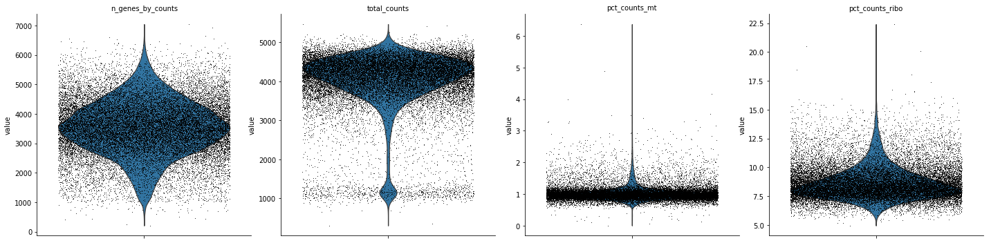

In [44]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"],
    jitter=0.4,
    multi_panel=True,)

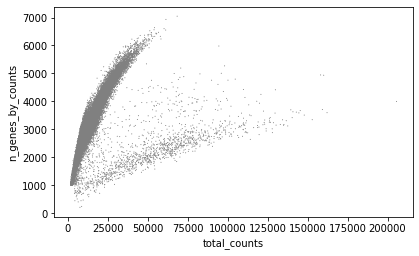

In [10]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts")

## Gene and Cell filtering
1. Remove genes found in less than 10 cells.  
2. Remove cells with less than 200 genes by counts.
3. Remove cells with less than 500 total counts.

In [11]:
# 1. Remove genes found in less than 10 cells.
print('Number of genes:', len(adata.var))
print('Removing genes in less than 10 cells... ⌛')
sc.pp.filter_genes(adata, min_cells = 5)
print('Number of genes:', len(adata.var))

Number of genes: 27998
Removing genes in less than 10 cells... ⌛
Number of genes: 17573


In [12]:
# 2. Remove cells with less than 200 genes by counts.
print('Number of cells:', len(adata.obs))
print('Removing cells with less than 200 genes by counts... ⌛')
sc.pp.filter_cells(adata, min_genes = 200)
print('Number of cells:', len(adata.obs))

Number of cells: 28456
Removing cells with less than 200 genes by counts... ⌛
Number of cells: 28456


In [13]:
# 2. Remove cells with less than 500 total counts.
print('Number of cells:', len(adata.obs))
print('Removing cells with less than 500 total counts... ⌛')
sc.pp.filter_cells(adata, min_counts = 500)
print('Number of cells:', len(adata.obs))

Number of cells: 28456
Removing cells with less than 500 total counts... ⌛
Number of cells: 28456


## Doublet Removal with scrublet
**Description:**  
Identifying doublets is crucial as they can lead to misclassifications or distortions in downstream analysis steps. Scrublet predicts cell doublets using a nearest-neighbor classifier of observed transcriptomes and simulated doublets.

In [14]:
print('Predicting doublets... ⌛')
sc.pp.scrublet(adata, batch_key="Sample")

Predicting doublets... ⌛


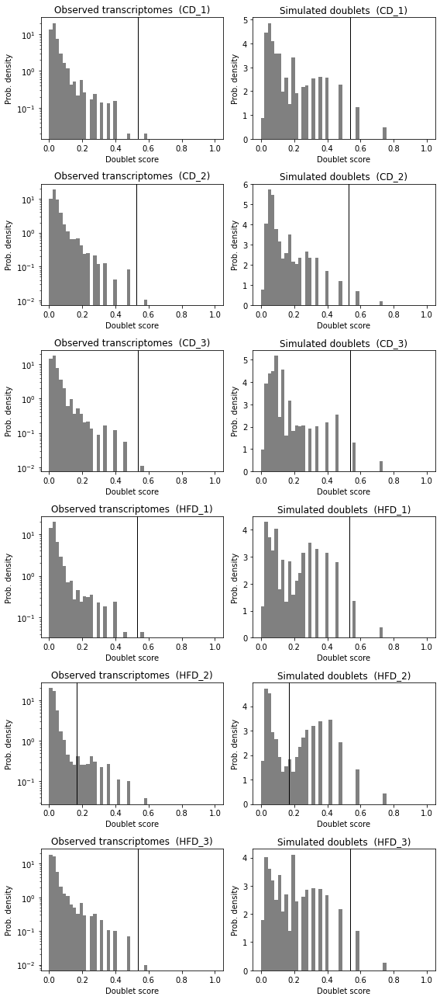

In [15]:
# Doublet score distribution by sample
sc.pl.scrublet_score_distribution(adata)

In [16]:
print('Number of predicted doublets:', adata.obs['predicted_doublet'].sum())

Number of predicted doublets: 272


In [17]:
print('Number of cells:', len(adata.obs))
print('Removing Doublets...')
adata = adata[adata.obs['predicted_doublet'] == False].copy()
print('Number of cells:', len(adata.obs))

Number of cells: 28456
Removing Doublets...
Number of cells: 28184


## Normalisation  
**Description:**  
A common approach is count depth scaling with subsequent log plus one (log1p) transformation. Count depth scaling normalizes the data to a “size factor” such as the median count depth in the dataset, ten thousand (CP10k) or one million (CPM, counts per million). The size factor for count depth scaling can be controlled via target_sum in pp.normalize_total. We are applying median count depth normalization with log1p transformation (AKA log1PF).

In [18]:
# Save raw counts for batch effect correction later 
adata.layers["counts"] = adata.X.copy() 

In [19]:
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)
adata.raw = adata

## Feature selection  
Keep only the top variable genes.  

In [20]:
# n_top_genes = 2000

# # Keep the top n variable genes
# print('Number of genes:', len(adata.var))

# # # Method 1
# # print(f'Selecting top {n_top_genes} variable genes... ⌛')
# # sc.pp.highly_variable_genes(adata, 
# #                             n_top_genes = n_top_genes, 
# #                             batch_key = 'Sample', 
# #                             subset = True, 
# #                             flavor = 'seurat_v3')

# # Method 2
# sc.pp.highly_variable_genes(adata, min_mean=0.0125, min_disp=0.5)
# adata = adata[:, adata.var['highly_variable']]

# print('Number of genes:', len(adata.var))

In [21]:
# sc.pl.highly_variable_genes(adata)

## Dimensionality Reduction  
**Description:**  
Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [22]:
sc.tl.pca(adata, random_state = 1)

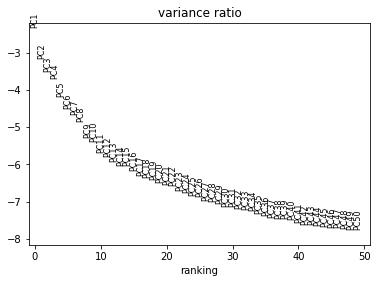

In [23]:
# Inspect contribution of each individual PC to the total variance in the data.
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

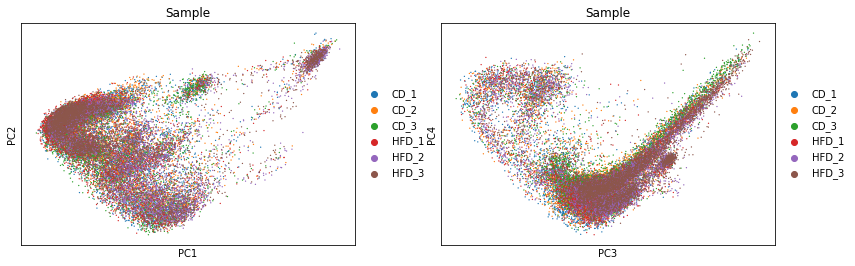

In [24]:
sc.pl.pca(
    adata,
    color=["Sample", "Sample"],
    dimensions=[(0, 1), (2, 3)],
    ncols=2,
    size=7,
)

## Nearest neighbor graph constuction and UMAP (Before Batch Correction)

In [25]:
sc.pp.neighbors(adata, random_state = 1)

In [26]:
sc.tl.umap(adata, random_state = 1)
sc.tl.leiden(adata, resolution = 0.35)

/tmp/ipykernel_5432/3286178967.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution = 0.35)


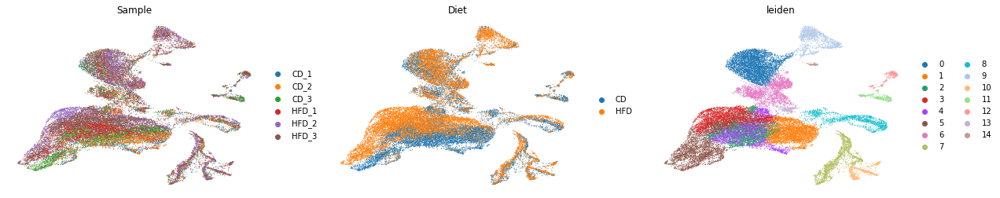

In [27]:
sc.pl.umap(
    adata,
    color=["Sample", "Diet", "leiden"],
    ncols=3,
    frameon=False,
)

## Batch Correction

In [28]:
## Build and train model
# scvi.model.SCVI.setup_anndata(adata, layer = "counts",
#                              categorical_covariate_keys=["Sample"])
# model = scvi.model.SCVI(adata)
# model.train() #may take a while without GPU
# model.save("my_model2/")

In [29]:
# Use trained model to correct the batch error
model = scvi.model.SCVI.load("my_model2/", adata=adata)
adata.obsm['X_scVI'] = model.get_latent_representation()
adata.layers['scvi_normalized'] = model.get_normalized_expression()

INFO     File my_model2/model.pt already downloaded                                                                


## Nearest neighbor graph constuction and UMAP (Batch Corrected)

In [30]:
# sc.pp.neighbors(adata, n_neighbors=25, n_pcs=50, method='gauss')
sc.pp.neighbors(adata, use_rep = 'X_scVI', random_state = 1)
sc.tl.umap(adata, random_state = 1)

In [31]:
sc.tl.leiden(adata, resolution = 0.35, random_state = 1)

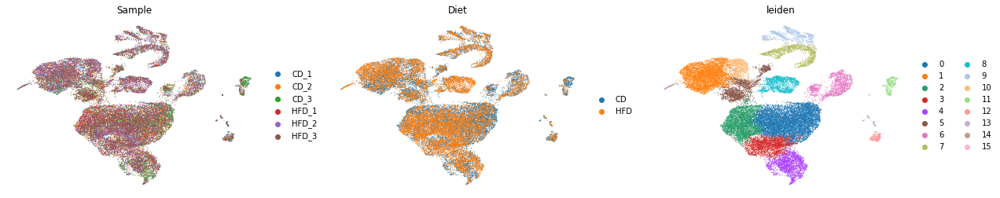

In [32]:
sc.pl.umap(
    adata,
    color=["Sample", "Diet", "leiden"],
    ncols=3,
    frameon=False
)

## Filter Lymphocyte Cells

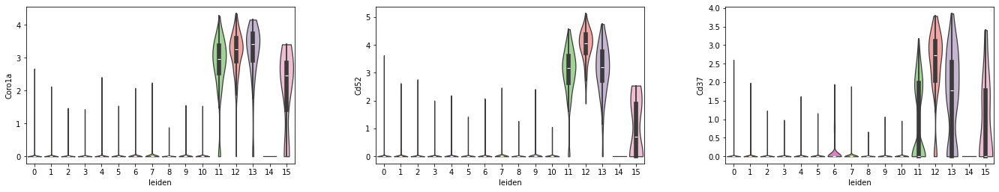

In [33]:
# lymphocyte markers
sc.pl.violin(adata, keys=['Coro1a', 'Cd52', 'Cd37'], groupby='leiden', inner="box", stripplot=False)

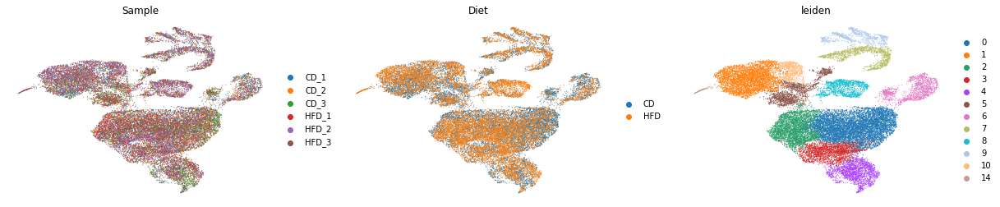

In [34]:
# Remove lymphocytes and replot
mask = ~adata.obs.leiden.isin(['11','12', '13', '15']) # Check these match the above plots
adata = adata[mask].copy()

sc.pl.umap(
    adata,
    color=["Sample", "Diet", "leiden"],
    ncols=3,
    frameon=False
)

## Mapping published annotations to my processed data

In [35]:
# adata = sc.read_h5ad('/home/glennrd/Documents/Research_Project/RNA-seq_Analysis/data/crypt_processed.h5ad') # unannotated
adata_published = sc.read_h5ad('/home/glennrd/Documents/Research_Project/RNA-seq_Analysis/published_reference_material/h5ad_files/1_GSE147319_adata_processed.h5ad') #annotations stored in obs. Column name = 'groups _named_prog4'

# Rownames in the obs object are the UMI names in both anndata objects

# Extract the 'obs' data frames
obs_unannotated = adata.obs
obs_annotated = adata_published.obs[['groups_named_prog4']]

# Merge the data frames on the index (UMIs), keeping only common UMIs
merged_obs = obs_unannotated.merge(obs_annotated, left_index=True, right_index=True, how='left')

# Rename the column in the merged DataFrame
merged_obs.rename(columns={'groups_named_prog4': 'published_annotations'}, inplace=True)

# Update the 'obs' attribute of the unannotated AnnData object
adata.obs = merged_obs

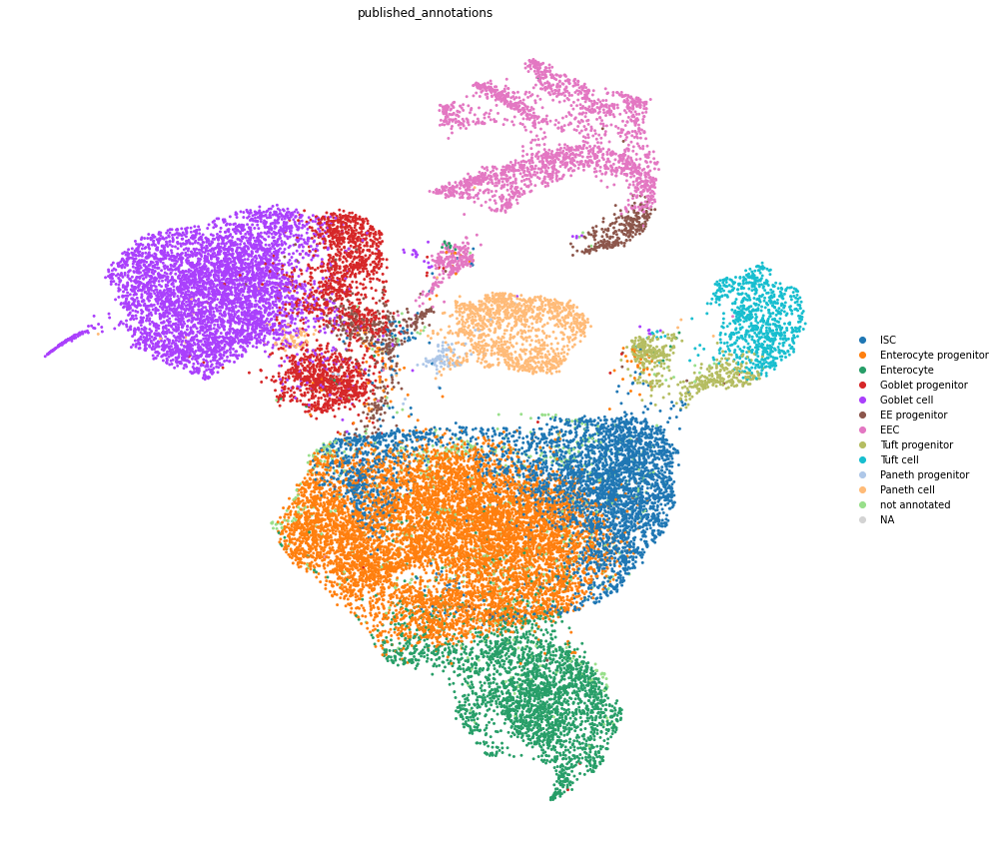

In [36]:
# Plot the UMAP
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["published_annotations"],
    frameon=False,
    size=35,
    ax=ax
)

# Show the plot
plt.show()

## Reclustering the EEC Group

Enteroendocrine (EE) cell types are usually classified based on their hormone production:

1. **L cells**  
   - Hormones: Glucagon-like peptide 1  
   - Markers: *Gcg*

2. **I cells**  
   - Hormones: Cholecystokinin  
   - Markers: *Cck*

3. **Enterochromaffin (EC) cells**  
   - Hormones: Serotonin  
   - Markers: *Tph1*, *Tac1*

4. **X cells**  
   - Hormones: Ghrelin  
   - Markers: *Ghrl*

5. **S cells**  
   - Hormones: Secretin  
   - Markers: *Sec*

6. **K cells**  
   - Hormones: Gastric inhibitory peptide  
   - Markers: *Gip*

7. **Delta cells**  
   - Hormones: Somatostatin  
   - Markers: *Sst*

8. **N cells**  
   - Hormones: Neurotensin  
   - Markers: *Nts*


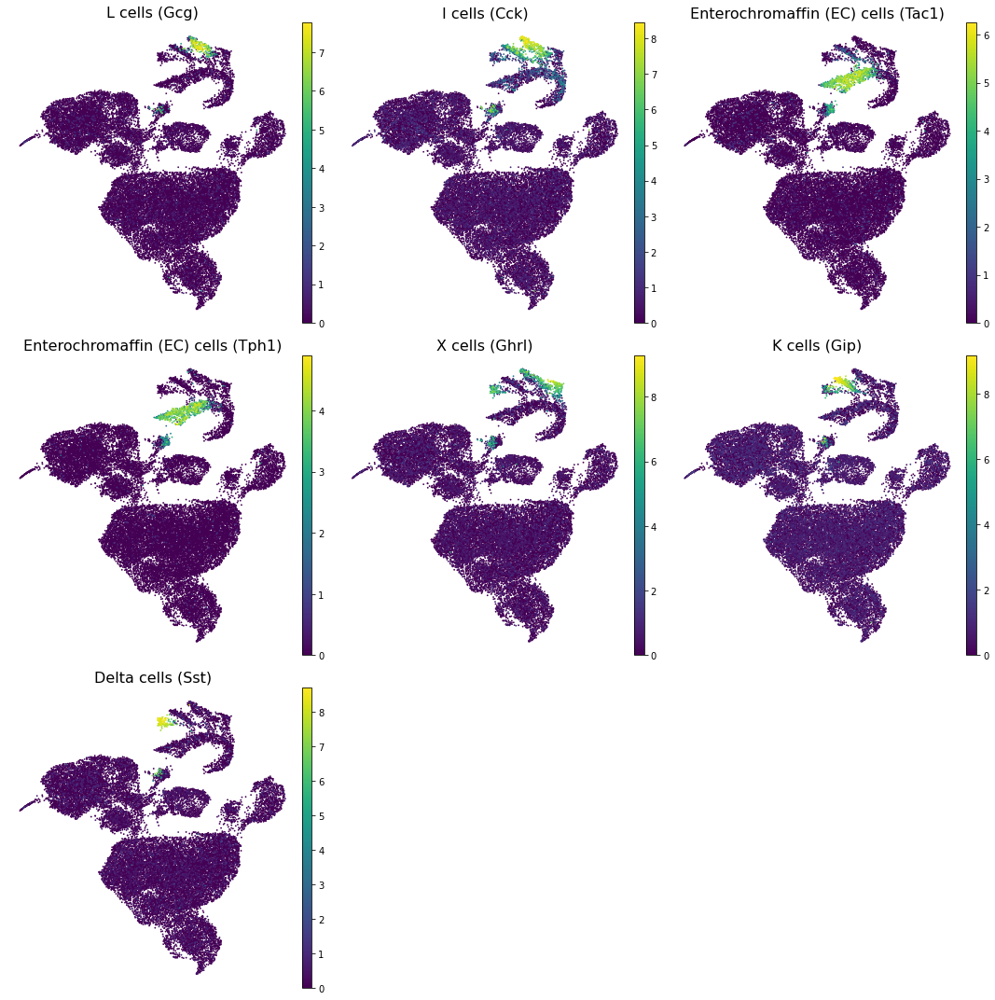

In [71]:
# Plot UMAP marker gene heatmap
marker_genes = ['Gcg', 'Cck', 'Tac1', 'Tph1', 'Ghrl', 'Gip', 'Sst']

marker_titles = {
    'Gcg': 'L cells (Gcg)',
    'Cck': 'I cells (Cck)',
    'Tac1': 'Enterochromaffin (EC) cells (Tac1)',
    'Tph1': 'Enterochromaffin (EC) cells (Tph1)',
    'Ghrl': 'X cells (Ghrl)',
    'Gip': 'K cells (Gip)',
    'Sst': 'Delta cells (Sst)'
}

# Create subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 15))  

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Plot each marker gene on a separate axis
for i, gene in enumerate(marker_genes):
    sc.pl.umap(
        adata,
        color=gene,
        frameon=False,
        size=13,
        ax=axes[i],
        color_map='viridis',
        show=False
    )
    axes[i].set_title(marker_titles[gene], fontsize=16)

# Remove empty subplots
for j in range(len(marker_genes), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

In [38]:
# Recluster the EEC cluster and add to a newly created annotation column in adata.obs 'EEC_refined_1'
sc.tl.louvain(adata, restrict_to=('published_annotations',['EEC']), key_added='EEC_refined_1', resolution=0.5, random_state = 1)

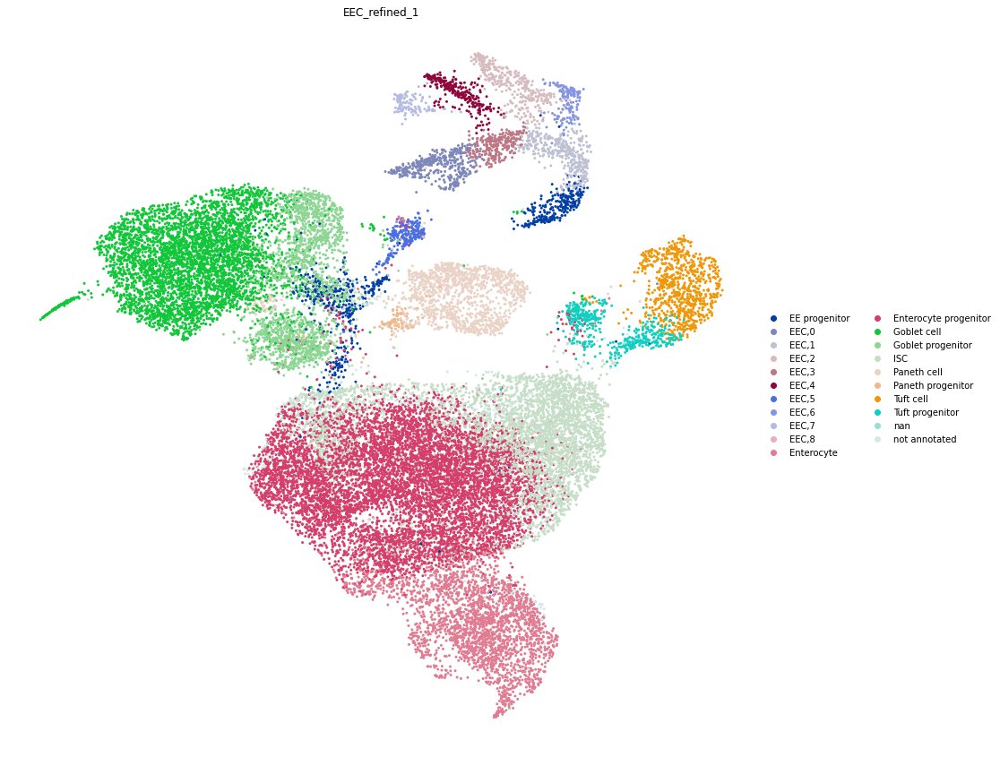

In [39]:
# Plot the UMAP
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["EEC_refined_1"],
    frameon=False,
    size=35,
    ax=ax
)

# Show the plot
plt.show()

In [40]:
# Annotate the newly clustered EEC clusters based off the marker gene heatmap

map1 = {'EEC (I/L)': ['EEC,2'],
        'EEC (EC)': ['EEC,0', 'EEC,3'],
        'EEC (X)': ['EEC,6'],
        'EEC (K)': ['EEC,4'],
        'EEC (Delta)': ['EEC,7']}

class_map = {v: k for k,vv in map1.items() for v in vv}

adata.obs['EEC_refined_final'] = adata.obs['EEC_refined_1']

adata.obs['EEC_refined_final'] = adata.obs['EEC_refined_1'].map(lambda x: class_map.get(x, 'EEC NS' if 'EEC' in x else x))

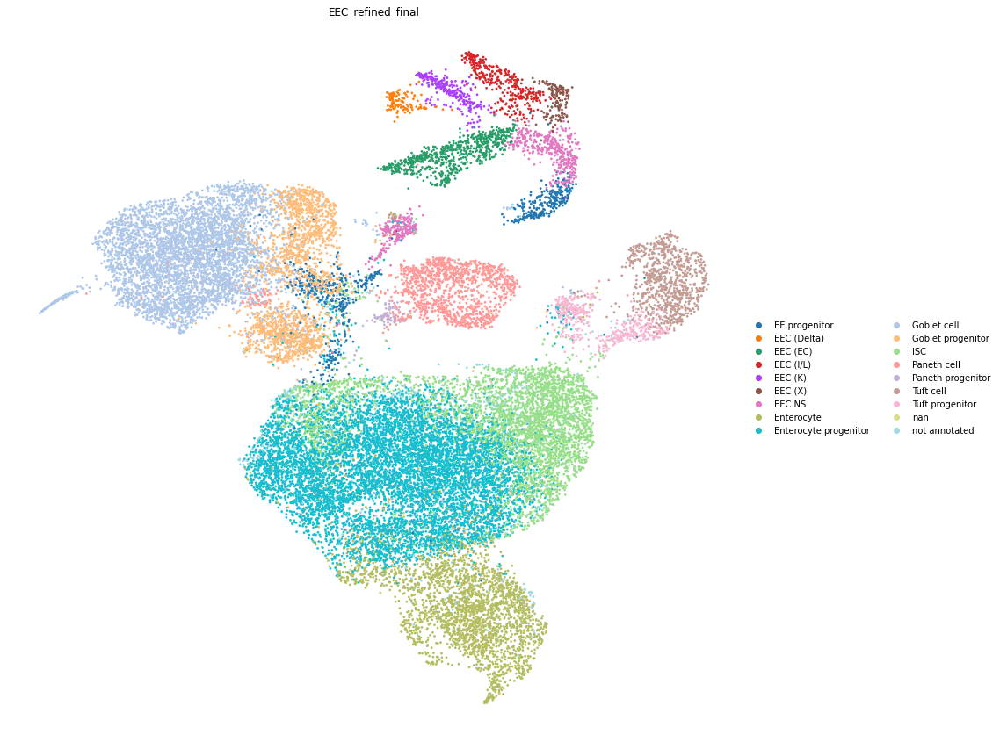

In [41]:
# Replot the UMAP
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["EEC_refined_final"],
    frameon=False,
    size=30,
    ax=ax
)

# Show the plot
plt.show()


## Remove non specific cells from EE progenitor

In [42]:
# Recluster the EEC progenitor cluster
sc.tl.louvain(adata, restrict_to=('EEC_refined_final',['EE progenitor']), key_added='final_annotations', resolution=0.2, random_state = 1)

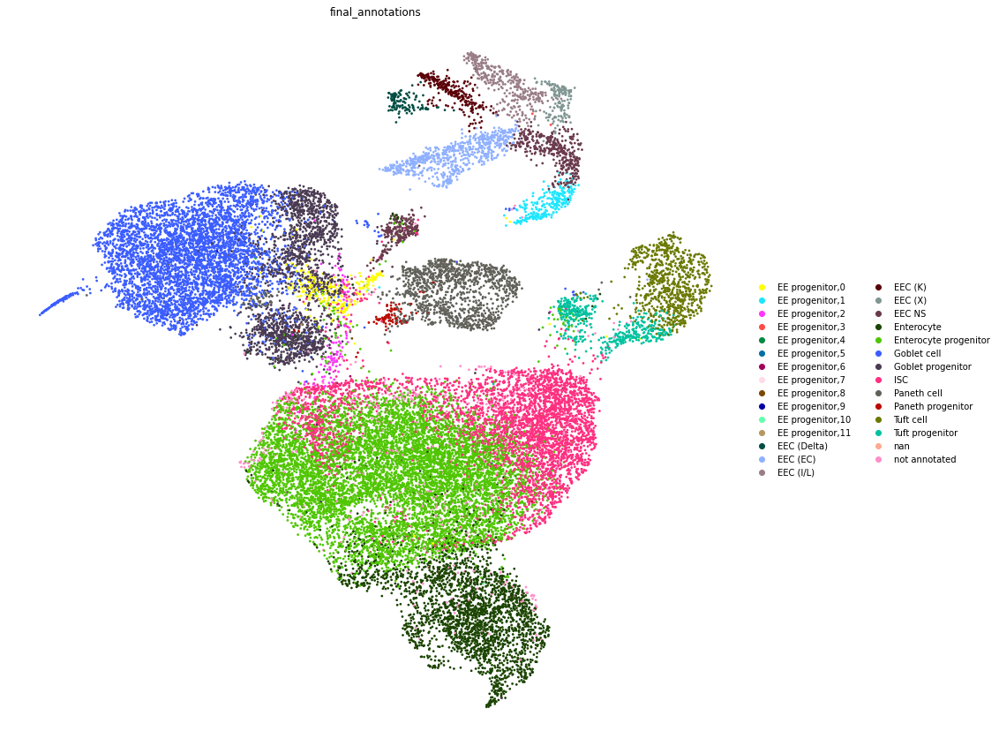

In [43]:
# Plot the UMAP again to view the new clusters
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["final_annotations"],
    frameon=False,
    size=30,
    ax=ax
)

# Show the plot
plt.show()

In [44]:
# Count number of cells in EEC groups
# Assuming 'adata' is your AnnData object and 'final_annotations' is the cluster column
cluster_labels = adata.obs['final_annotations']

# Create a DataFrame for easier manipulation
df = pd.DataFrame({'cluster': cluster_labels})

# Filter clusters where the name contains 'EE'
filtered_clusters = df[df['cluster'].str.contains('EE')]

# Count the number of cells in each cluster
cluster_counts = filtered_clusters['cluster'].value_counts()

# Print the counts
print(cluster_counts)


EEC (EC)                 684
EEC NS                   629
EEC (I/L)                352
EEC (K)                  264
EE progenitor,0          263
EE progenitor,1          254
EEC (X)                  150
EEC (Delta)              118
EE progenitor,2          112
EE progenitor,3            2
EE progenitor,6            1
EE progenitor,4            1
EE progenitor,5            1
EE progenitor,11           1
EE progenitor,10           1
EE progenitor,9            1
EE progenitor,8            1
EE progenitor,7            1
Enterocyte                 0
Enterocyte progenitor      0
Goblet cell                0
Goblet progenitor          0
ISC                        0
Paneth cell                0
Paneth progenitor          0
Tuft cell                  0
Tuft progenitor            0
nan                        0
not annotated              0
Name: cluster, dtype: int64


In [45]:
# Combine small EEC clusters into one cluster:

# Define the clusters to combine and the target label
clusters_to_combine = [
    'EE progenitor,3',
    'EE progenitor,6',
    'EE progenitor,4',
    'EE progenitor,5',
    'EE progenitor,11',
    'EE progenitor,10',
    'EE progenitor,9',
    'EE progenitor,8',
    'EE progenitor,7'
]
target_label = 'EE progenitor,3'

# Extract the current cluster labels
cluster_labels = adata.obs['final_annotations']

# Update cluster labels for the specified clusters
adata.obs['final_annotations'] = cluster_labels.apply(lambda x: target_label if x in clusters_to_combine else x)

# Optionally, check the distribution of clusters after the update
print(adata.obs['final_annotations'].value_counts())

Enterocyte progenitor    8325
Goblet cell              4539
ISC                      3943
Enterocyte               2598
Goblet progenitor        1844
Paneth cell              1258
Tuft cell                 816
not annotated             699
EEC (EC)                  684
EEC NS                    629
Tuft progenitor           476
EEC (I/L)                 352
EEC (K)                   264
EE progenitor,0           263
EE progenitor,1           254
EEC (X)                   150
EEC (Delta)               118
EE progenitor,2           112
Paneth progenitor          82
EE progenitor,3            10
nan                         3
Name: final_annotations, dtype: int64


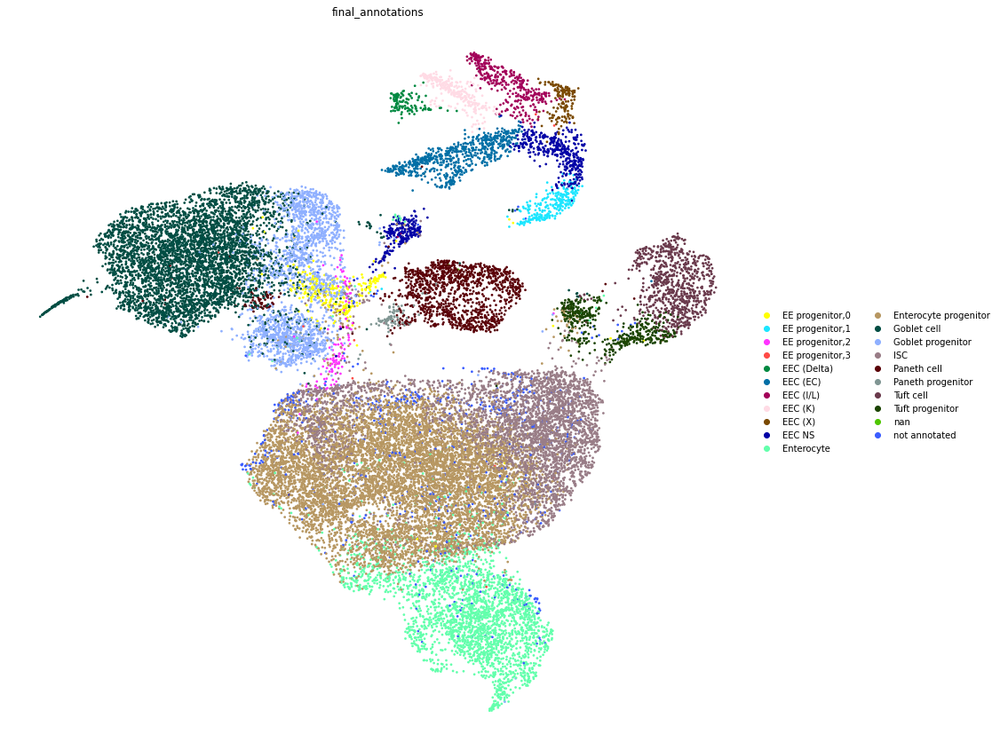

In [46]:
# Plot the UMAP again to view the new clusters
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["final_annotations"],
    frameon=False,
    size=30,
    ax=ax
)

# Show the plot
plt.show()

In [47]:
# Add EEC progenitor 3 to the 'not annotated' cluster

# Define the clusters to combine and the target label
clusters_to_combine = [
    'EE progenitor,3'
]
target_label = 'not annotated'

# Extract the current cluster labels
cluster_labels = adata.obs['final_annotations']

# Update cluster labels for the specified clusters
adata.obs['final_annotations'] = cluster_labels.apply(lambda x: target_label if x in clusters_to_combine else x)

In [48]:
# Combine EEC progenitors into one cluster:

# Define the clusters to combine and the target label
clusters_to_combine = [
    'EE progenitor,0',
    'EE progenitor,2'
]
target_label = 'Unkown progenitor'

# Extract the current cluster labels
cluster_labels = adata.obs['final_annotations']

# Update cluster labels for the specified clusters
adata.obs['final_annotations'] = cluster_labels.apply(lambda x: target_label if x in clusters_to_combine else x)

In [49]:
# Combine nan and not annotated clusters:

# Define the clusters to combine and the target label
clusters_to_combine = [
    'nan',
    'not annotated'
]
target_label = 'not annotated'

# Extract the current cluster labels
cluster_labels = adata.obs['final_annotations']

# Update cluster labels for the specified clusters
adata.obs['final_annotations'] = cluster_labels.apply(lambda x: target_label if x in clusters_to_combine else x)

In [50]:
# Rename 'EE progenitor,1' to 'EE progenitor'
adata.obs['final_annotations'] = adata.obs['final_annotations'].replace('EE progenitor,1', 'EE progenitor')

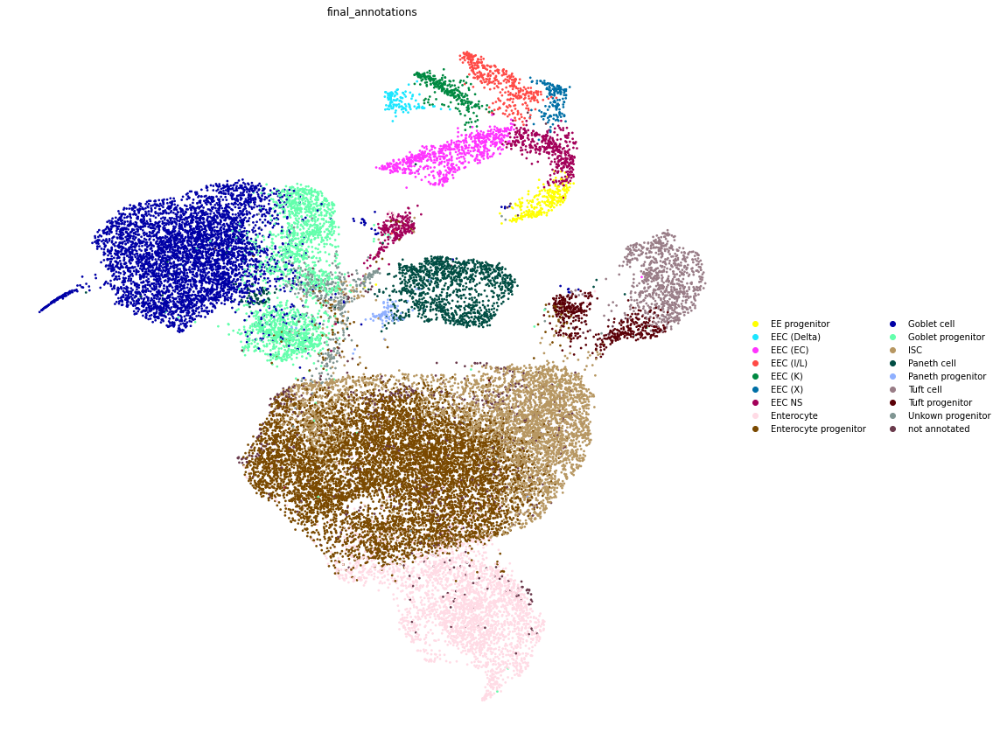

In [51]:
# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["final_annotations"],
    frameon=False,
    size=30,
    ax=ax
)

# Show the plot
plt.show()

## Confirming annotations with marker genes (violin plots/heatmap)

In [52]:
marker_dict = {'ISC': ['Lgr5', 'Olfm4', 'Axin2', 'Ascl2', 'Slc12a2'],
               'Enterocyte': ['Fabp1', 'Alpi', 'Apoa1', 'Apoa4', 'Lct'],
               'Goblet': ['Muc2', 'Tff3', 'Agr2', 'Spdef', 'Klf4', 'Tff3', 'Ccl9', 'Manf'],
               'Goblet progenitor': ['Spdef', 'Atoh1'],
               'Paneth': ['Lyz1', 'Mmp7', 'Defa17', 'Defa22', 'Ang4'],
               'EEC': ['Neurod1', 'Neurod2', 'Insm1', 'Chga', 'Chgb'],
               'EE progenitor': ['Sox4', 'Neurog3', 'Foxa2', 'Foxa3', 'Marcksl1'],
               'Tuft': ['Dclk1', 'Trpm5', 'Gfi1b', 'Il25'],
               'Lymphocyte': ['Coro1a', 'Cd52', 'Cd37']
               }

#### - Create violin plots: expression of markers per cluster

Violin plot: Clusters expressing ISC markers:


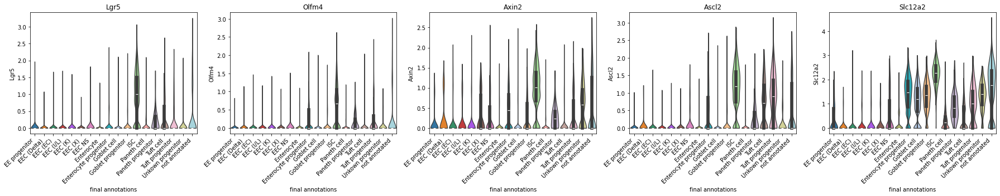

Violin plot: Clusters expressing Enterocyte markers:


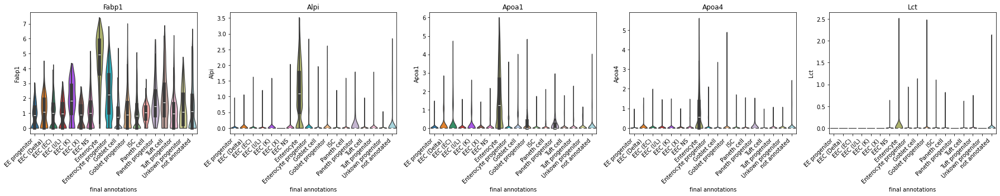

Violin plot: Clusters expressing Goblet markers:


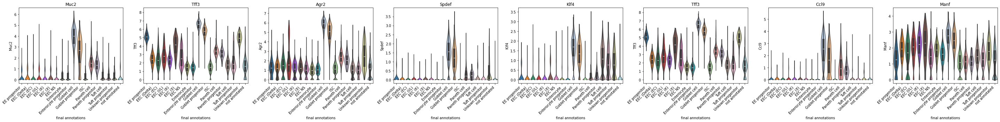

Violin plot: Clusters expressing Goblet progenitor markers:


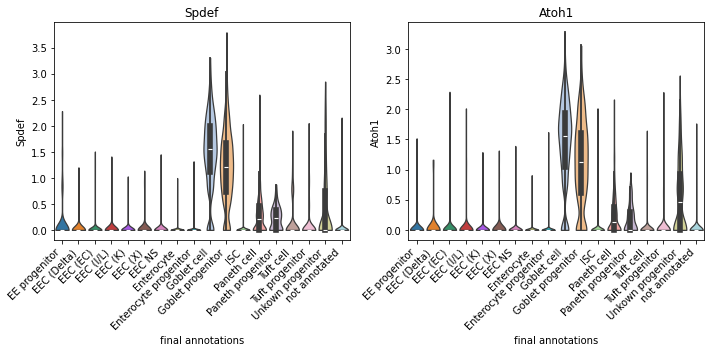

Violin plot: Clusters expressing Paneth markers:


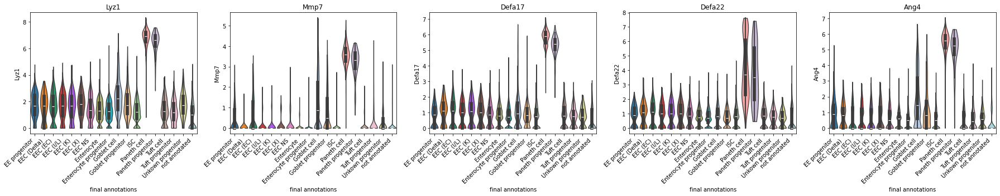

Violin plot: Clusters expressing EEC markers:


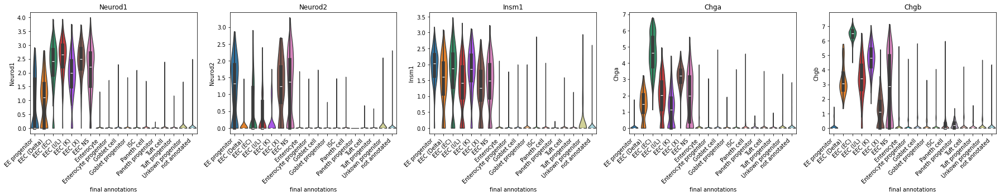

Violin plot: Clusters expressing EE progenitor markers:


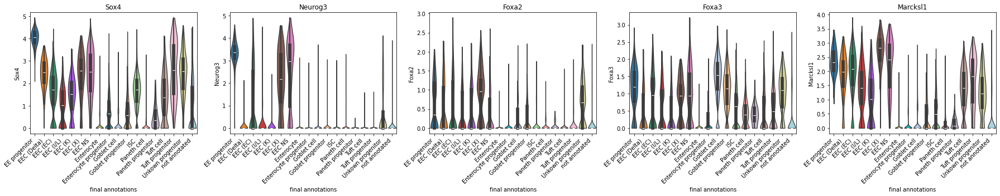

Violin plot: Clusters expressing Tuft markers:


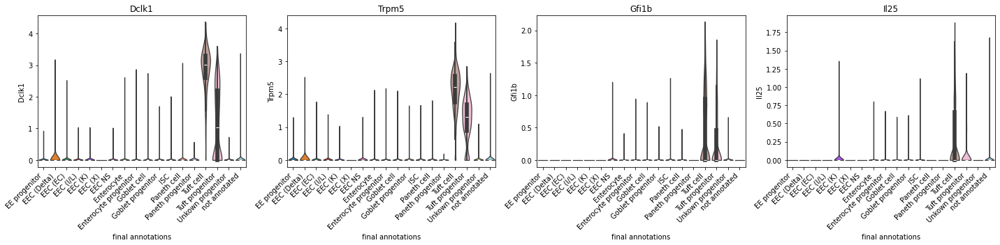

Violin plot: Clusters expressing Lymphocyte markers:


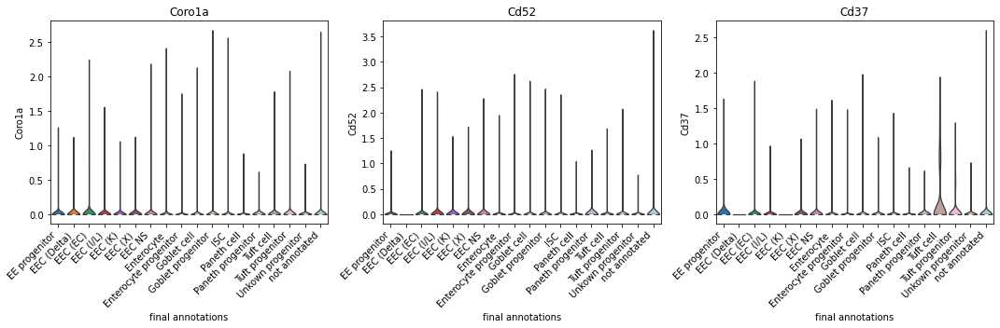

In [53]:
# Iterate over items in marker_dict
for marker, genes in marker_dict.items():
    print(f"Violin plot: Clusters expressing {marker} markers:")
    
    # Create a figure with subplots for this marker
    fig, axes = plt.subplots(1, len(genes), figsize=(len(genes) * 5, 5))
    
    # Iterate over genes associated with the current marker
    for i, gene in enumerate(genes):
        # Select the current axis
        ax = axes[i]
        
        # Plot the violin plot
        sc.pl.violin(adata,
                     keys=gene,
                     groupby='final_annotations',
                     inner="box",
                     stripplot=False,
                     show=False,
                     ax=ax)  # Pass the axis to plot on
        
        # Set plot title (optional)
        ax.set_title(gene)
        
        # Adjust alignment of x-axis labels
        for tick in ax.get_xticklabels():
            tick.set_rotation(45)
            tick.set_horizontalalignment('right')
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    
    # Display the plots for the current marker
    plt.show()

#### - Colour the umap by marker genes

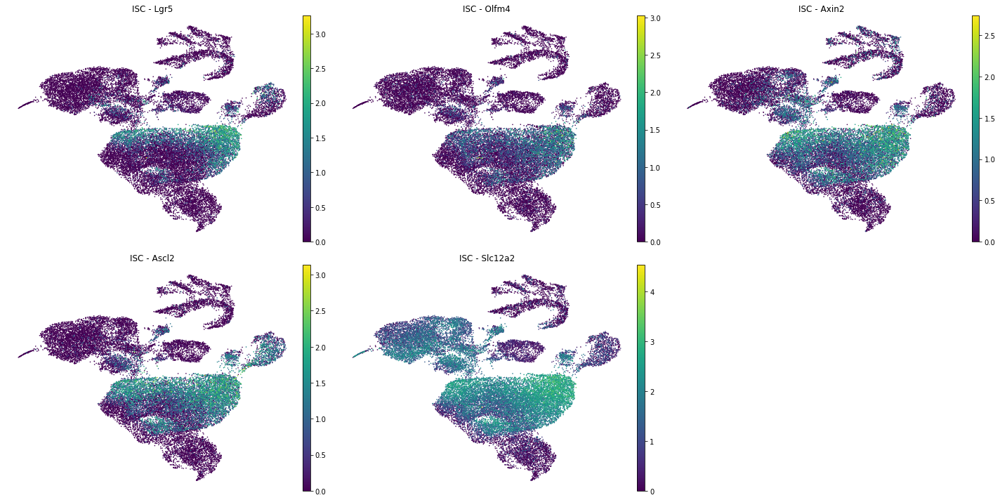

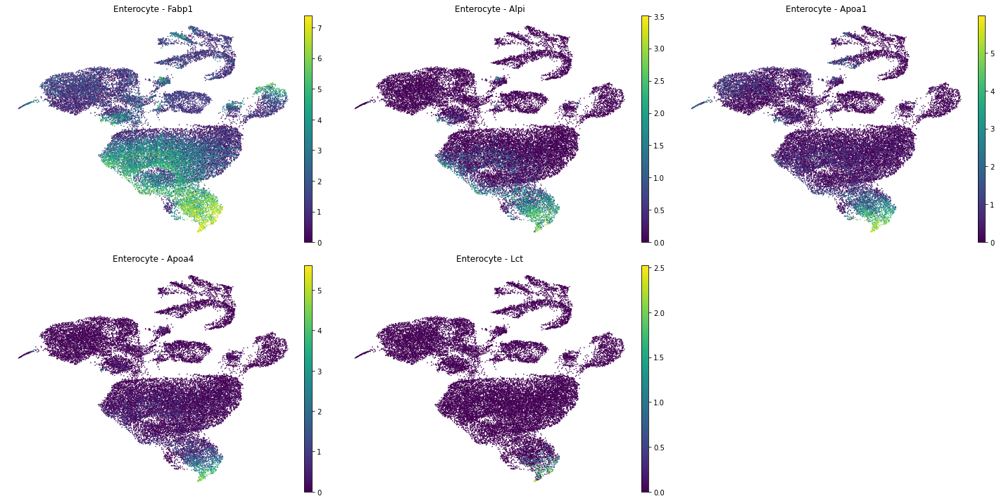

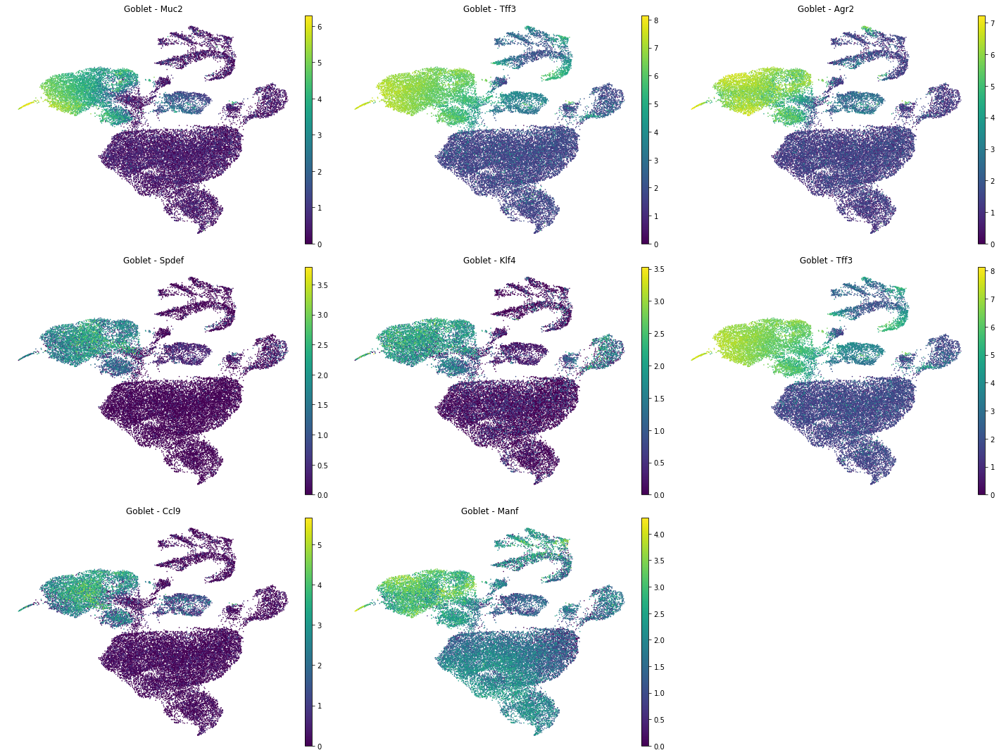

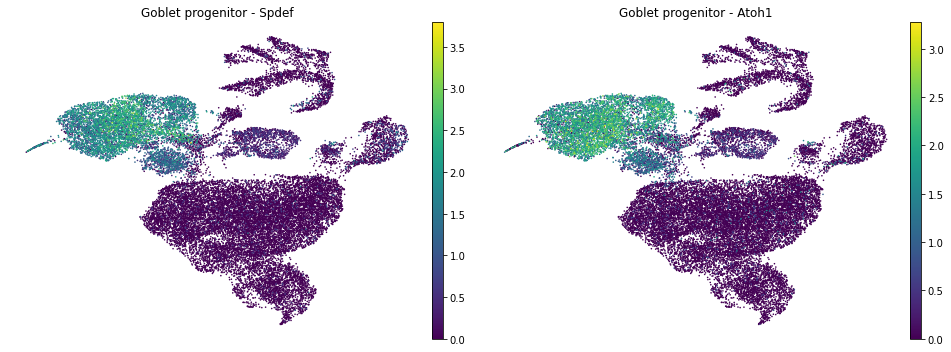

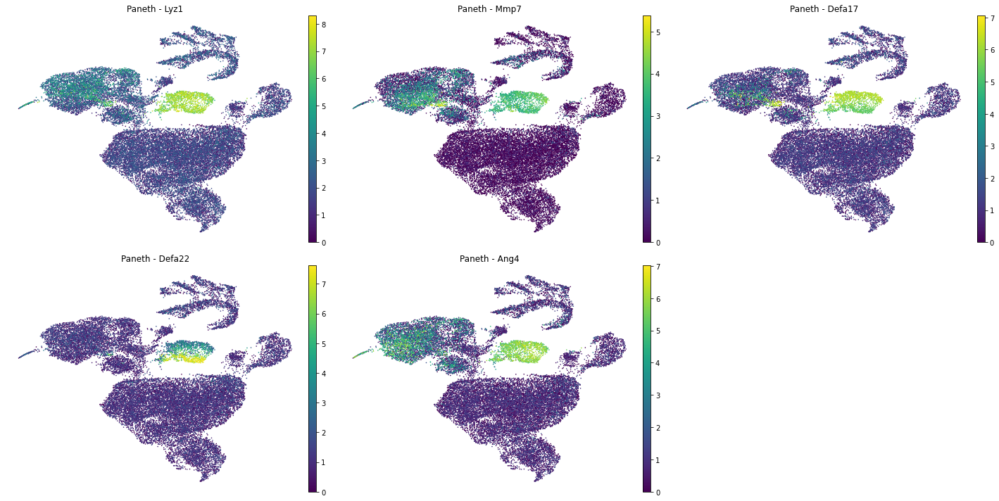

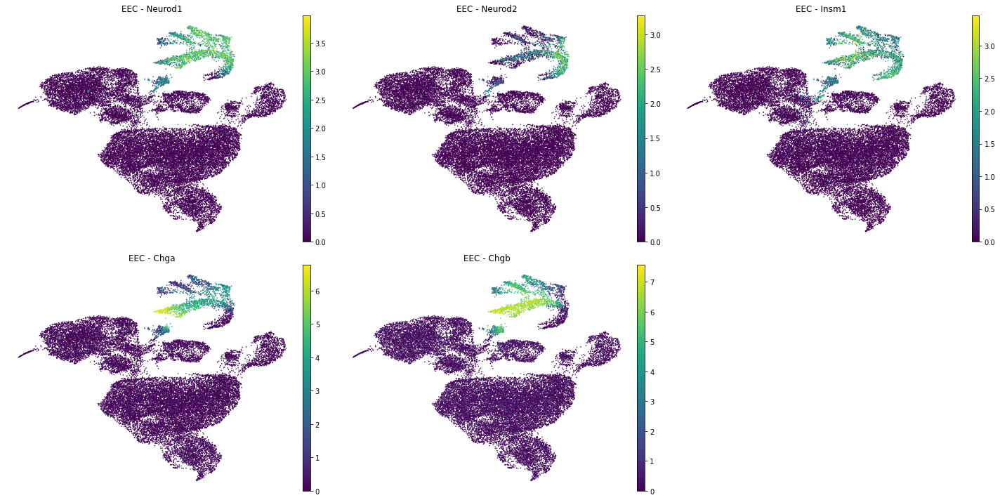

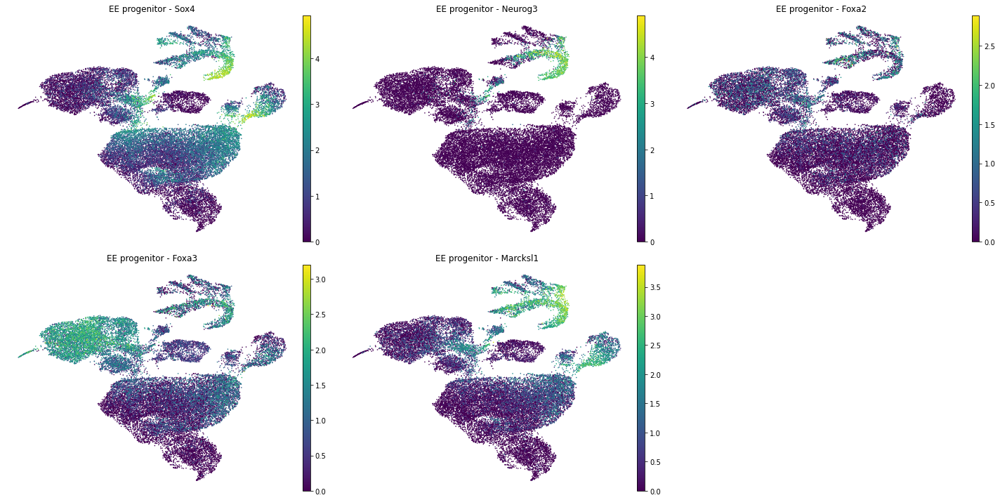

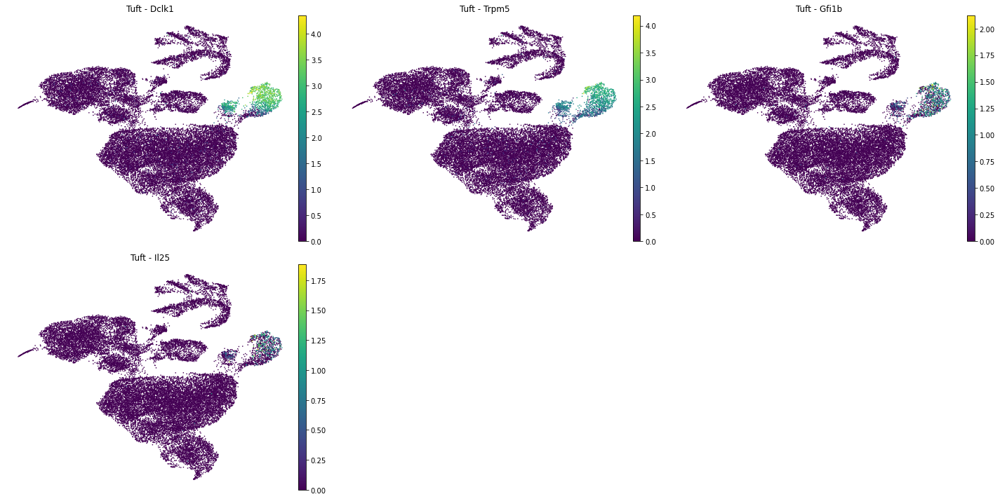

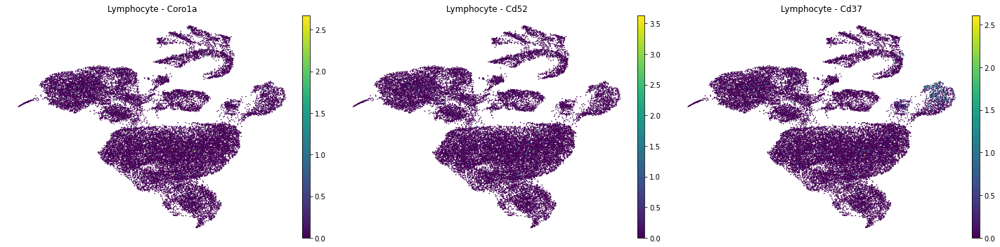

In [54]:
# Loop through each cell type and their markers
for cell_type, markers in marker_dict.items():
    # Calculate the number of rows needed
    n_markers = len(markers)
    n_cols = 3
    n_rows = (n_markers + n_cols - 1) // n_cols  # Ceiling division

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))

    # Flatten the axes array for easier indexing
    axes = axes.flatten()

    for i, gene in enumerate(markers):
        sc.pl.umap(
            adata, 
            color=gene, 
            title=f'{cell_type} - {gene}',
            frameon=False, 
            ax=axes[i], 
            size = 10,
            color_map='viridis', 
            show=False
        )
        axes[i].set_facecolor('black')

    # Remove empty subplots
    for j in range(n_markers, len(axes)):
        fig.delaxes(axes[j])

    # Adjust layout
    plt.tight_layout()
    plt.show()

## Plot UMAP based off diet

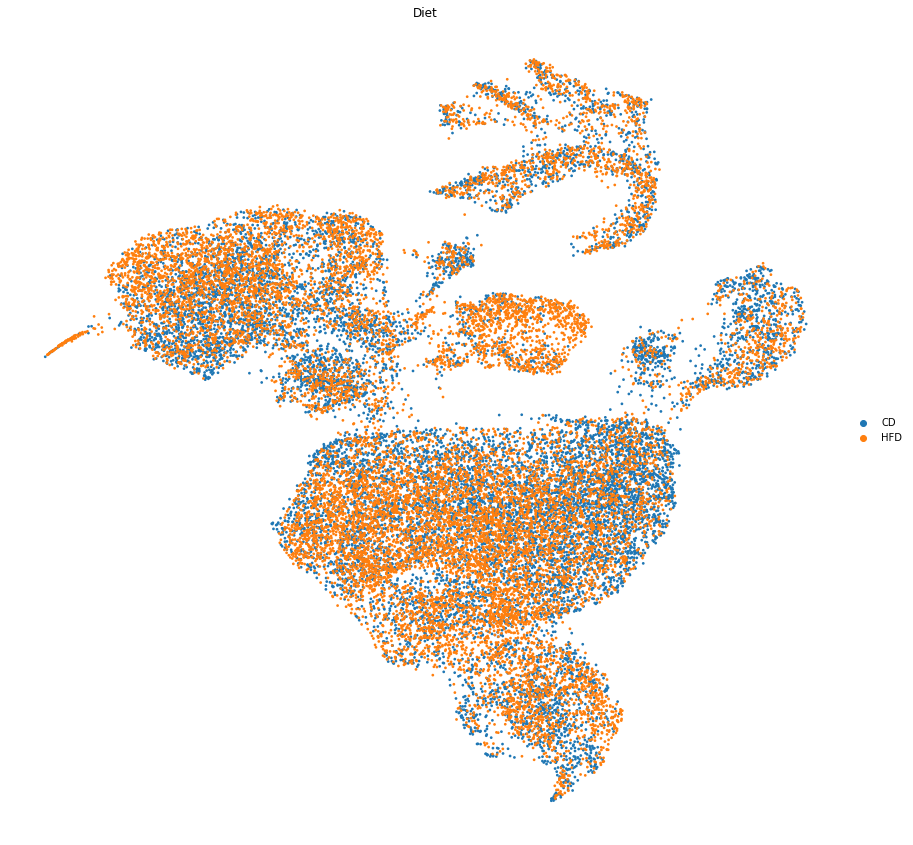

In [55]:
# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["Diet"],
    frameon=False,
    size=30,
    ax=ax
)

# Show the plot
plt.show()

## Create an annotation of all major cell types (not clustered into different EEC groups)

In [56]:
cells_crypts = adata.obs['final_annotations'].unique()
print('List of unique cells in crypt data:')
for cell in cells_crypts:
    print(cell)

List of unique cells in crypt data:
Enterocyte progenitor
Goblet cell
EEC (EC)
EEC (I/L)
Goblet progenitor
ISC
not annotated
Tuft progenitor
Enterocyte
Tuft cell
EE progenitor
EEC NS
Unkown progenitor
Paneth cell
EEC (K)
EEC (X)
EEC (Delta)
Paneth progenitor


In [57]:
# Combine nan and not annotated clusters:

# Define the clusters to combine and the target label
clusters_to_combine = [
    'EEC (EC)',
    'EEC (I/L)',
    'EEC (K)',
    'EEC (X)',
    'EEC (Delta)',
    'EEC NS'
]
target_label = 'EEC'

# Extract the current cluster labels
cluster_labels = adata.obs['final_annotations']

# Update cluster labels for the specified clusters
adata.obs['major_cell_types'] = cluster_labels.apply(lambda x: target_label if x in clusters_to_combine else x)

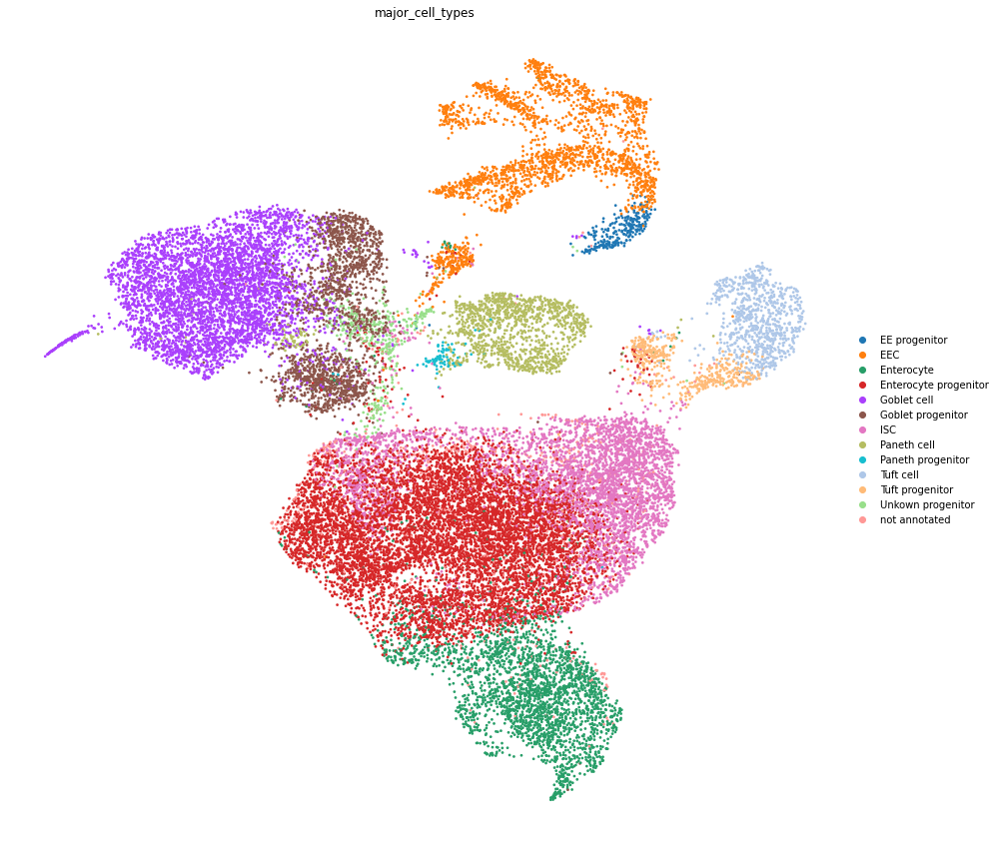

In [58]:
# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["major_cell_types"],
    frameon=False,
    size=30,
    ax=ax
)

# Show the plot
plt.show()

## Output the H5ad file  
**Strategy:**  
Only output what will be used subsequently.  
  

**List of things to keep:**  
adata.X  
adata.obs  
adata.var  
adata.uns['umap']  
adata.uns['Sample_colors']  
adata.uns['Diet_colors']  
adata.uns['final_annotations']  
adata.uns['final_annotations_colors']  
adata.uns['published_annotations_colors']  

In [59]:
adata

AnnData object with n_obs × n_vars = 27419 × 17573
    obs: 'Sample', 'Diet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'leiden', '_scvi_batch', '_scvi_labels', 'published_annotations', 'EEC_refined_1', 'EEC_refined_final', 'final_annotations', 'major_cell_types'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet', 'log1p', 'pca', 'Sample_colors', 'neighbors', 'umap', 'leiden', 'Diet_colors', 'leiden_colors', '_scvi_uuid', '_scvi_manager_uuid', 'publis

In [60]:
adata_reduced = adata.copy()

In [61]:
# Specify the components to keep in .uns
uns_keys_to_keep = [
    'umap', 'Sample_colors', 'Diet_colors', 
    'final_annotations', 'final_annotations_colors', 'published_annotations_colors', 'major_cell_types_colors'
]

# Create a new dictionary with only the specified keys
adata_uns_filtered = {key: adata_reduced.uns[key] for key in uns_keys_to_keep if key in adata_reduced.uns}

# Assign the filtered uns dictionary back to adata
adata_reduced.uns = adata_uns_filtered

# Remove unnecessary layers, obsm, varm, obsp, varp, raw
adata_reduced.layers.clear()  # Clear any layers
adata_reduced.varm.clear()    # Clear any varm
adata_reduced.obsp.clear()    # Clear any obsp (e.g., pairwise similarities)
adata_reduced.varp.clear()    # Clear any varp (e.g., pairwise similarities for variables)

# Check if raw data is present and remove it if not needed
if adata_reduced.raw is not None:
    del adata_reduced.raw

In [62]:
adata_reduced.write('crypt_enriched.h5ad')

## Test that the h5ad works correctly

In [3]:
adata_2 = sc.read_h5ad('crypt_enriched.h5ad')
adata_2

AnnData object with n_obs × n_vars = 27419 × 17573
    obs: 'Sample', 'Diet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'leiden', '_scvi_batch', '_scvi_labels', 'published_annotations', 'EEC_refined_1', 'EEC_refined_final', 'final_annotations', 'major_cell_types'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'Diet_colors', 'Sample_colors', 'final_annotations', 'final_annotations_colors', 'major_cell_types_colors', 'published_annotations_colors', 'umap'
    

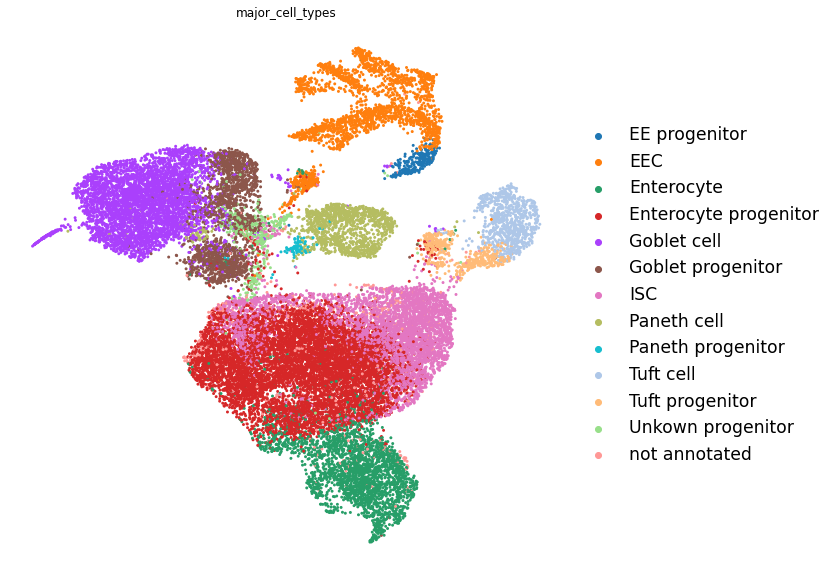

In [4]:
# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(10, 10))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata_2,
    color=["major_cell_types"],
    frameon=False,
    size=35,
    legend_fontsize = 'xx-large',
    ax=ax
)

# Show the plot
plt.show()

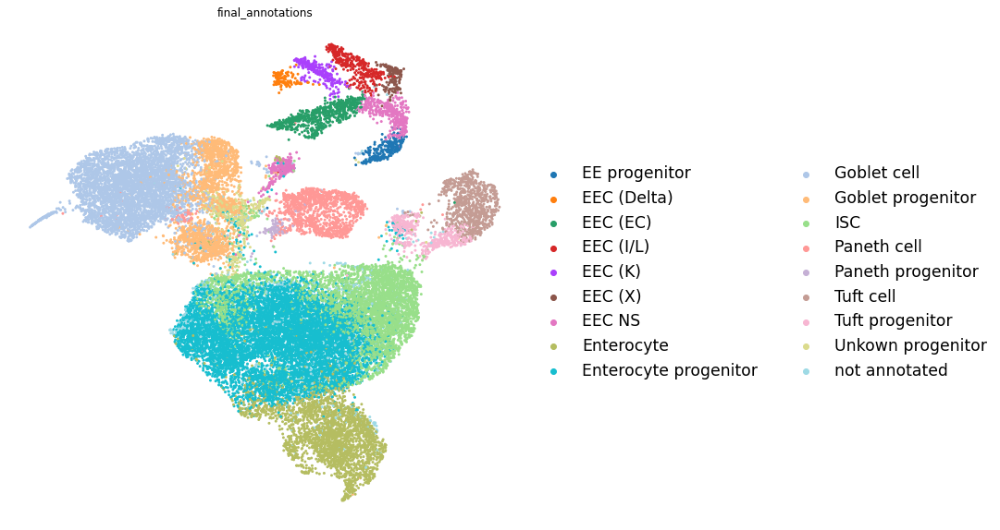

In [5]:
# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(10, 10))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata_2,
    color=["final_annotations"],
    frameon=False,
    size=35,
    legend_fontsize = 'xx-large',
    ax=ax
)

# Show the plot
plt.show()

## Create stacked bar chart of cell counts

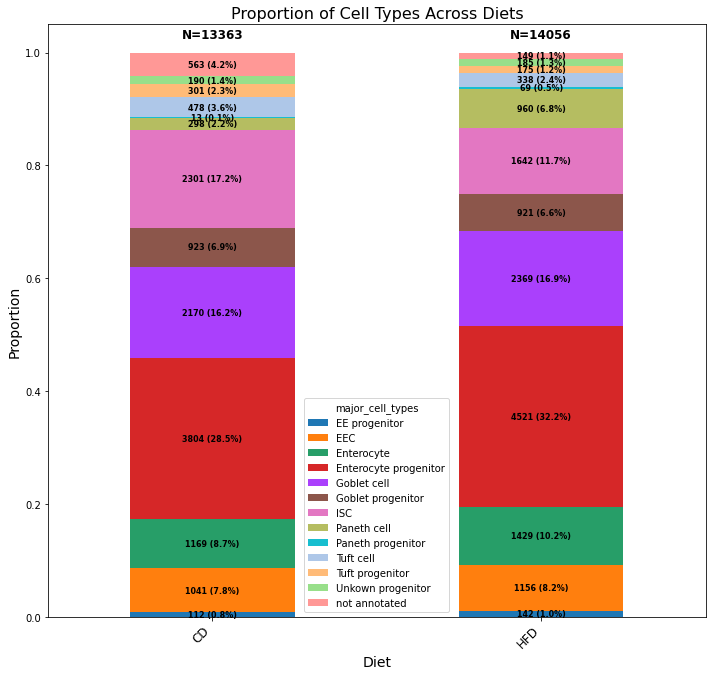

In [66]:
# Calculate the proportions and counts of each cell type within each condition
cell_type_counts = adata_2.obs.groupby(['Diet', 'major_cell_types']).size().unstack(fill_value=0)
cell_type_proportions = cell_type_counts.div(cell_type_counts.sum(axis=1), axis=0)

# Sample size per condition
sample_sizes = cell_type_counts.sum(axis=1)

# Extract the predefined colors from the AnnData object
cell_type_colors = adata_2.uns['major_cell_types_colors']

# Create a color map dictionary
unique_cell_types = cell_type_counts.columns
color_map = dict(zip(unique_cell_types, cell_type_colors))

# Ensure the colors are applied in the same order as the cell types
cell_type_colors = [color_map[cell_type] for cell_type in unique_cell_types]

# Plotting the stacked bar chart
fig, ax = plt.subplots(figsize=(10, 10))

# Plot each cell type as a stack with predefined colors
bars = cell_type_proportions.plot(kind='bar', stacked=True, ax=ax, color=cell_type_colors)

# Add labels and title with increased font size
ax.set_ylabel('Proportion', fontsize=14)
ax.set_xlabel('Diet', fontsize=14)
ax.set_title('Proportion of Cell Types Across Diets', fontsize=16)

# Annotate sample sizes above each bar
for i, (cond, size) in enumerate(sample_sizes.items()):
    ax.text(i, 1.02, f'N={size}', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Annotate number of cells within each cell type on the bar segments
for i, (cond, row) in enumerate(cell_type_counts.iterrows()):
    cum_sum = 0
    for j, (cell_type, count) in enumerate(row.items()):
        proportion = cell_type_proportions.loc[cond, cell_type]
        if proportion > 0:
            percentage = proportion * 100
            ax.text(i, cum_sum + proportion / 2, f'{count} ({percentage:.1f}%)', ha='center', va='center', fontsize=8, color='black', weight = 'bold')
            cum_sum += proportion

# Rotate x-axis labels for better readability and increase font size
plt.xticks(rotation=45, ha='right', fontsize=12)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Display the plot
plt.show()


## Replot the EEC UMAP

/home/glennrd/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


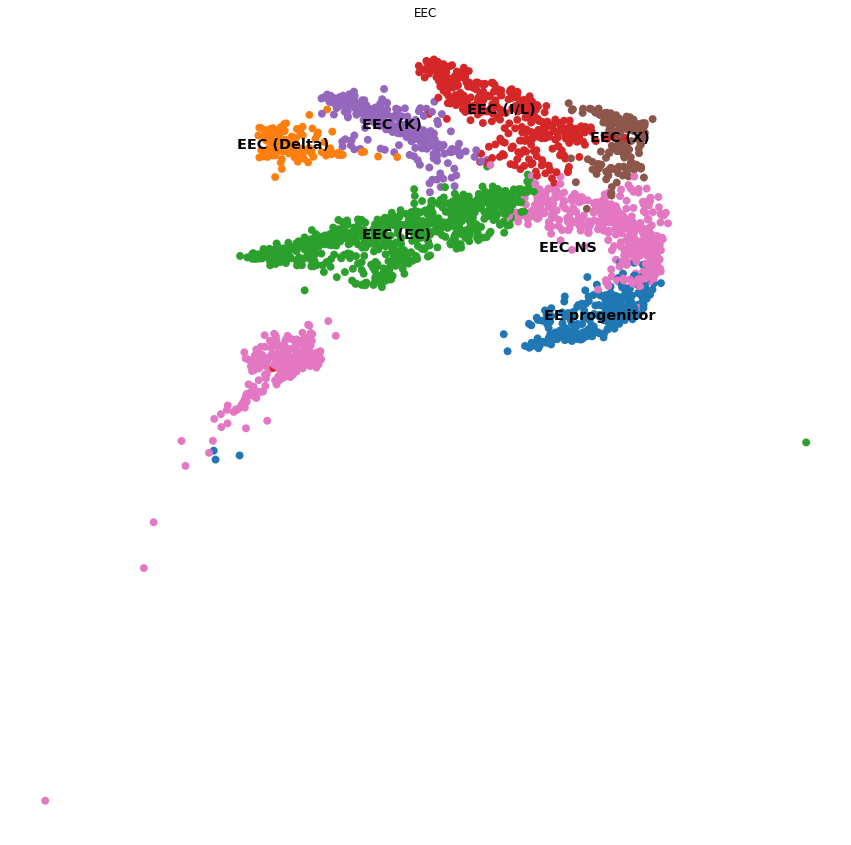

In [73]:
# Step 1: Rename the annotation column
adata_2.obs['EEC'] = adata_2.obs['final_annotations']

# Step 2: Label any cell that doesn't begin with 'EE' as 'NA'
adata_2.obs['EEC'] = adata_2.obs['EEC'].apply(lambda x: x if x.startswith('EE') else 'NA')

# Step 3: Plot the UMAP, excluding cells labeled 'NA'
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata_2[adata_2.obs['EEC'] != 'NA'],
    color=["EEC"],
    legend_loc='on data',
    frameon=False,
    size=250,
    legend_fontsize = 'x-large',
    ax=ax
)

# Show the plot
plt.show()

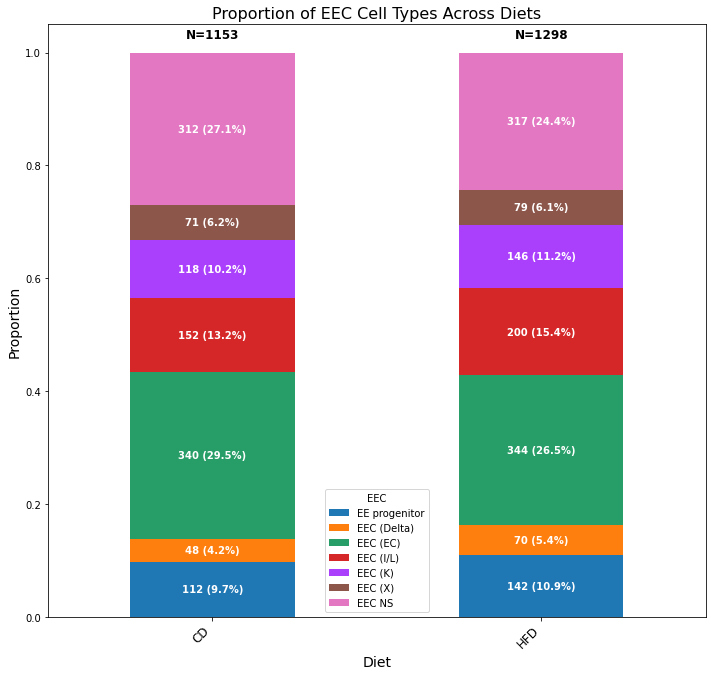

In [54]:
# Step 4: Calculate the proportions and counts of each cell type within each condition
cell_type_counts = adata_2.obs[adata_2.obs['EEC'] != 'NA'].groupby(['Diet', 'EEC']).size().unstack(fill_value=0)
cell_type_proportions = cell_type_counts.div(cell_type_counts.sum(axis=1), axis=0)

# Sample size per condition
sample_sizes = cell_type_counts.sum(axis=1)

# Extract the predefined colors from the AnnData object (if available)
cell_type_colors = adata_2.uns['major_cell_types_colors']

# Create a color map dictionary
unique_cell_types = cell_type_counts.columns
color_map = dict(zip(unique_cell_types, cell_type_colors))

# Ensure the colors are applied in the same order as the cell types
cell_type_colors = [color_map[cell_type] for cell_type in unique_cell_types]

# Step 5: Plotting the stacked bar chart
fig, ax = plt.subplots(figsize=(10, 10))

# Plot each cell type as a stack with predefined colors
bars = cell_type_proportions.plot(kind='bar', stacked=True, ax=ax, color=cell_type_colors)

# Add labels and title with increased font size
ax.set_ylabel('Proportion', fontsize=14)
ax.set_xlabel('Diet', fontsize=14)
ax.set_title('Proportion of EEC Cell Types Across Diets', fontsize=16)

# Annotate sample sizes above each bar
for i, (cond, size) in enumerate(sample_sizes.items()):
    ax.text(i, 1.02, f'N={size}', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Annotate percentages within each cell type on the bar segments
for i, (cond, row) in enumerate(cell_type_counts.iterrows()):
    cum_sum = 0
    for j, (cell_type, count) in enumerate(row.items()):
        proportion = cell_type_proportions.loc[cond, cell_type]
        if proportion > 0:
            percentage = proportion * 100
            ax.text(i, cum_sum + proportion / 2, f'{count} ({percentage:.1f}%)', ha='center', va='center', fontsize=10, color='white', weight='bold')
            cum_sum += proportion

# Rotate x-axis labels for better readability and increase font size
plt.xticks(rotation=45, ha='right', fontsize=12)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Display the plot
plt.show()

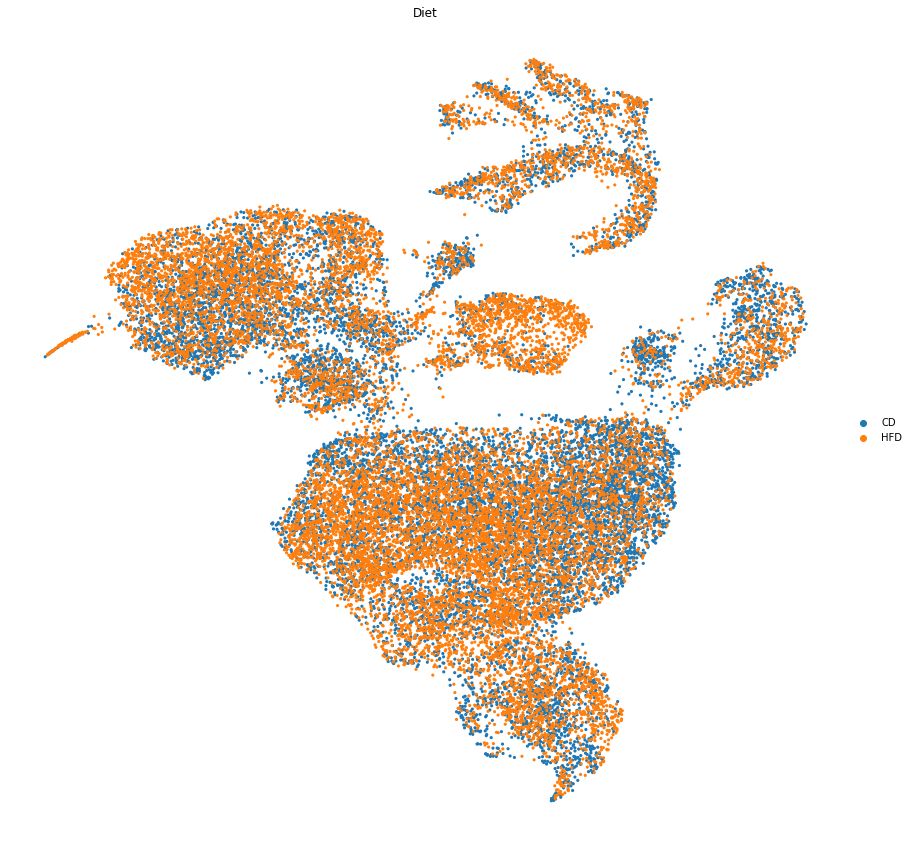

In [79]:
# Plot the UMAP
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata_2,
    color=["Diet"],
    frameon=False,
    size=40,
    ax=ax
)

# Show the plot
plt.show()

## Pseudobulk

In [82]:
adata = sc.read_h5ad('crypt_enriched.h5ad')

In [83]:
adata

AnnData object with n_obs × n_vars = 27419 × 17573
    obs: 'Sample', 'Diet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'leiden', '_scvi_batch', '_scvi_labels', 'published_annotations', 'EEC_refined_1', 'EEC_refined_final', 'final_annotations', 'major_cell_types'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'Diet_colors', 'Sample_colors', 'final_annotations', 'final_annotations_colors', 'major_cell_types_colors', 'published_annotations_colors', 'umap'
    

In [104]:
import scipy
# Combine all gene counts of all cells for each sample
# Group by 'Sample' and sum the counts
pseudobulk = adata.to_df().groupby(adata.obs['Sample']).sum()

# Create a new AnnData object for the pseudobulk data with sparse matrix
pseudobulk_adata = sc.AnnData(X=scipy.sparse.csr_matrix(pseudobulk.values))

# Add the sample and diet information to the new AnnData object
pseudobulk_adata.var = adata.var
columns_to_remove = ['mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells']  # Replace with actual column names
# Remove specified columns
pseudobulk_adata.var = pseudobulk_adata.var.drop(columns=columns_to_remove)

pseudobulk_adata.obs['n_genes'] = np.sum(pseudobulk_adata.X > 0, axis=1).A1

pseudobulk_adata.obs['Sample'] = pseudobulk.index
pseudobulk_adata.obs['Diet'] = pseudobulk_adata.obs['Sample'].apply(lambda x: x[:-2])

# Label each sample's cell type as 'Intestinal epithelium'
pseudobulk_adata.obs['major_cell_types'] = 'Intestinal epithelium'

In [110]:
pseudobulk_adata.write('crypt_enriched_pseudobulk.h5ad')